## 1. Introduction

### 1.1.1 Dataset construction

In [9]:
import numpy as np

# Start by creating a design matrix for regression with m = 150 examples, each of dimension d = 75.
# We will choose a true weight vector theta that has only a few non-zero components:

# 1. Construct a random design matrix X 
X = np.random.rand(150,75)
X

array([[ 0.51084434,  0.57741383,  0.43286969, ...,  0.68157061,
         0.88956353,  0.98302823],
       [ 0.39877752,  0.1288516 ,  0.6607542 , ...,  0.92778473,
         0.6304438 ,  0.99221998],
       [ 0.18732895,  0.96844517,  0.80247792, ...,  0.531702  ,
         0.19662497,  0.24776499],
       ..., 
       [ 0.00534232,  0.66183113,  0.77223489, ...,  0.7477656 ,
         0.21076776,  0.29779924],
       [ 0.93258999,  0.69491237,  0.41611813, ...,  0.46842795,
         0.70982012,  0.64670757],
       [ 0.46951983,  0.11641133,  0.11632246, ...,  0.59736207,
         0.35287265,  0.82661891]])

### 1.1.2

In [10]:

# 2. Construct a true weight vector theta. Set the first 10 component of theta to 10 or -10 arbitrarily and all the other components to zero.
t = [-1,1]
theta_1 = np.random.choice(t,10)*10
theta_2 = np.zeros(65)
theta = np.concatenate((theta_1,theta_2), axis=0)
theta

array([-10., -10., -10.,  10.,  10.,  10., -10., -10.,  10., -10.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.])

### 1.1.3

In [11]:
# 3. Construct a vector y = X theta + epsilon, where epsilon is a random noise vector
epsilon = 0.1*np.random.randn(150)
y = np.dot(X,theta)+epsilon
y

array([ -8.31354434,  -8.52228361, -15.78118784, -26.15119609,
       -29.04963584, -21.79625573,   0.22053171, -19.48710216,
       -25.03260205,  -5.22282856, -14.60948433, -19.35487102,
       -13.86450422, -11.97444641,   2.19502584, -18.33091156,
       -18.25371639,   2.90922138, -13.64949195,  -4.53378698,
        -9.45820339,   7.75164811,   4.42850654, -14.93324941,
         3.34941045,  -5.03600618,  10.77497584, -16.63434776,
       -15.06879327,  -9.27909469, -14.309946  ,  -3.46682549,
        -7.91293466,   7.68689394, -18.40726054, -17.08968389,
       -16.55909757, -12.28684915, -25.30730033,   4.45017191,
       -15.72197188, -18.43567883,  -9.06704298, -10.33191988,
        -0.09699087, -10.59713976, -12.96509519, -21.22354538,
        -1.8990468 ,  -6.30530338, -10.87685433, -12.66294105,
        -6.4221498 , -17.04561782,  -5.32285023, -22.68943888,
        -9.75188725, -28.44450846,  11.026678  ,   3.201852  ,
       -21.94201676, -12.60318128, -15.31026943, -24.08

### 1.1.4

In [12]:
# 4. Split the dataset by taking the first 80 points for training, the next 20 points for validation,
# and the last 50 points for testing
X_training_1 = X[0:80,:]
y_training_1 = y[0:80]
X_validation_1 = X[80:100,:]
y_validation_1 = y[80:100]
X_testing_1 = X[100:150,:]
y_testing_1 = y[100:150]

# 5. Save six files to local
np.savetxt('X_train.txt', X_training_1) 
np.savetxt('y_train.txt', y_training_1) 
np.savetxt('X_valid.txt', X_validation_1)
np.savetxt('y_valid.txt', y_validation_1) 
np.savetxt('X_test.txt', X_testing_1) 
np.savetxt('y_test.txt', y_testing_1) 

### 2.1 Ridge Regression

In [104]:
from scipy.optimize import minimize

X_train = np.loadtxt("/Users/sunevan/Dropbox/Spring 2017/Machine Learning/2/Assignment/hw2-lasso/data/X_train.txt")
y_train = np.loadtxt("/Users/sunevan/Dropbox/Spring 2017/Machine Learning/2/Assignment/hw2-lasso/data/y_train.txt")
X_valid = np.loadtxt("/Users/sunevan/Dropbox/Spring 2017/Machine Learning/2/Assignment/hw2-lasso/data/X_valid.txt")
y_valid = np.loadtxt("/Users/sunevan/Dropbox/Spring 2017/Machine Learning/2/Assignment/hw2-lasso/data/y_valid.txt")
(N,D) = X_train.shape
w = np.random.rand(D,1)
(N_valid,D_valid) = X_valid.shape


In [108]:
def ridge(Lambda):
    def ridge_obj(theta):
        return ((np.linalg.norm(np.dot(X_train,theta) - y_train))**2)/(2*N) + Lambda*(np.linalg.norm(theta))**2
    return ridge_obj

def compute_loss(Lambda, theta):
    return ((np.linalg.norm(np.dot(X_valid,theta) - y_valid))**2)/(2*N_valid)

lambda_list_ridge = np.zeros(len(range(-20,6)))
loss_list_ridge = np.zeros(len(range(-20,6)))
coefficients_list_ridge = np.zeros(((len(range(-20,6)),D)))
range_list_ridge = list(range(-20,6))                           
for i in range(len(range_list_ridge)):
    e = range_list_ridge[i]                                                    
    Lambda = 10**e
    w_opt = minimize(ridge(Lambda), w)
    lambda_list_ridge[i]=Lambda
    loss_list_ridge[i] =compute_loss(Lambda, w_opt.x)  
    coefficients_list_ridge[i,:] = w_opt.x
    print (Lambda, compute_loss(Lambda, w_opt.x))

1e-20 0.0592310158443
1e-19 0.0592310158443
1e-18 0.059230724318
1e-17 0.0592305379939
1e-16 0.0592307736486
1e-15 0.0592309699723
1e-14 0.0592310950309
1e-13 0.0592310587634
1e-12 0.0592304778711
1e-11 0.0592313070396
1e-10 0.0592314077886
1e-09 0.0592313498792
1e-08 0.059238999088
1e-07 0.0593157376875
1e-06 0.0600997597876
1e-05 0.0692716789883
0.0001 0.212135049337
0.001 1.53746020113
0.01 6.71417640987
0.1 19.9768098889
1 31.1312023011
10 197.027956987
100 619.549164265
1000 731.586299646
10000 744.446042418
100000 745.750729868


In [109]:
print ("Best Lambda: "+ str(lambda_list_ridge[np.argmin(loss_list_ridge)]))
print ("Minimum Loss on Validation: "+ str(min(loss_list_ridge)))

Best Lambda: 1e-12
Minimum Loss on Validation: 0.0592304778711


#### it seems that it converges when the lambda is smaller than 1e-7

In [159]:
import math 
zeros_count_1 = 0
small_count_1 = 0 
zeros_count_2 = 0
small_count_2 = 0 

for i in list(coefficients_list_ridge[np.argmin(loss_list_ridge)][0:10]):
    if i == 0:
        zeros_count_1+=1
    if math.fabs(i) <= 10**-3:
        small_count_1 += 1 
for i in list(coefficients_list_ridge[np.argmin(loss_list_ridge)][10:]):

    if i == 0:
        zeros_count_2 += 1
    if math.fabs(i) <= 0.001:
        print (i)
        small_count_2 += 1 
        
print ("For the first 10 coef (non-zero), there is ",zeros_count_1, " coef has been predicted as 0" )
print ("For the first 10 coef (non-zero), there is ",small_count_1, " coef has been predicted smaller than 1e-3" )
print ("For the rest of coef (zero), there is ",zeros_count_2, " coef has been predicted as 0" )
print ("For the rest of coef (zero), there is ",small_count_2, " coef has been predicted as smaller than 1e-3" )
    

For the first 10 coef (non-zero), there is  0  coef has been predicted as 0
For the first 10 coef (non-zero), there is  0  coef has been predicted smaller than 1e-3
For the rest of coef (zero), there is  0  coef has been predicted as 0
For the rest of coef (zero), there is  0  coef has been predicted as smaller than 1e-3


#### So, the first 10 coefficence have not been predicted to zero or a small number. For all the coef that were supposed to be predicted to zero, none have been predicted to be so. 

## 3. Coordomate Descent for Lasso

#### 3.1 Experiments with the shooting algorithm

In [35]:
def shooting_algorithm(X, y, w, Lambda, threshold = 1e-5):    
    (N,D) = X.shape
    while True:
        ww = w.copy()
        for j in range(D):
            
            a = 0           
            c = 0
            
            for i in range(N):
                a = a + 2 * (X[i][j])**2
                c = c+ 2*X[i,j]*(y[i]- np.dot(w[:],X[i,:]) + w[j]*X[i,j])
            
            if (np.abs(c/a)-Lambda/a)>0:
                w[j] = np.sign(c/a)*(np.abs(c/a)-Lambda/a)
            else:
                w[j] = 0
    

        if np.linalg.norm(w - ww) < threshold:
            return w

In [43]:
init_w = np.dot(np.dot((np.dot(X_train.T,X_train)+Lambda*np.identity(X_train.shape[1]))**-1,X_train.T),y_train)

In [160]:
def compute_loss(X,y,w):
    return ((np.linalg.norm(np.dot(X,w) - y))**2)/(2*X.shape[0])

range_list = list(range(-6,4))
lambda_list = list()
for i in range_list:
    lambda_list.append(10**i)

validation_loss = np.zeros(len(range(-6,4)))
train_loss = np.zeros(len(range(-6,4)))
test_loss = np.zeros(len(range(-6,4)))
w_list = np.zeros(((len(range(-6,4)),X_training_1.shape[1])))


from datetime import datetime

startTime = datetime.now()

for i in range(len(range(-6,4))):                                                      
    w_list[i] = shooting_algorithm(X_training_1, y_training_1, init_w, lambda_list[i], threshold = 1e-5)
    validation_loss[i] = compute_loss(X_validation_1,y_validation_1,w_list[i])
    test_loss[i] = compute_loss(X_testing_1,y_testing_1,w_list[i])
    train_loss[i] = compute_loss(X_training_1,y_training_1,w_list[i])
    
    print ("Lambda: ",lambda_list[i], "Loss on Train: ",train_loss[i], "Loss on Validation: ",validation_loss[i])
    
    
print (datetime.now() - startTime)

Lambda:  1e-06 Loss on Train:  0.000367958432046 Loss on Validation:  0.144821422449
Lambda:  1e-05 Loss on Train:  0.000367955253128 Loss on Validation:  0.144566822519
Lambda:  0.0001 Loss on Train:  0.000367963361718 Loss on Validation:  0.141035204227
Lambda:  0.001 Loss on Train:  0.000372319329169 Loss on Validation:  0.106644721072
Lambda:  0.01 Loss on Train:  0.00049084638722 Loss on Validation:  0.0219292272154
Lambda:  0.1 Loss on Train:  0.000934173809627 Loss on Validation:  0.0136425854829
Lambda:  1 Loss on Train:  0.00580603441205 Loss on Validation:  0.0146642291507
Lambda:  10 Loss on Train:  0.225775391613 Loss on Validation:  0.296432133309
Lambda:  100 Loss on Train:  19.6094132941 Loss on Validation:  23.0648333575
Lambda:  1000 Loss on Train:  96.6647576982 Loss on Validation:  134.607314857
0:06:10.022076


In [162]:
print ("Best Lambda: "+ str(lambda_list[np.argmin(validation_loss)]))
print ("Minimum Loss on Validation: "+ str(min(validation_loss)))

Best Lambda: 0.1
Minimum Loss on Validation: 0.0136425854829


In [163]:
import matplotlib.pyplot as plt
%matplotlib inline

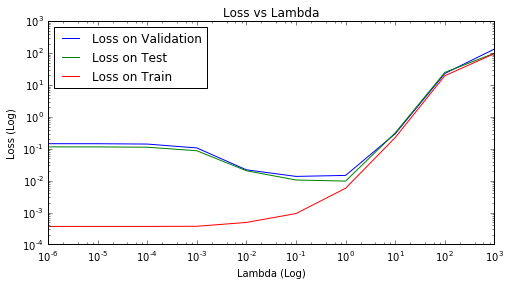

In [164]:
fig = plt.figure(figsize = (8,4))
plt.plot(lambda_list,validation_loss,label = "Loss on Validation")
plt.plot(lambda_list,test_loss,label = "Loss on Test")
plt.plot(lambda_list,train_loss,label = "Loss on Train")
plt.legend(loc = "upper left")
plt.yscale('log')
plt.xscale('log')
plt.title('Loss vs Lambda')
plt.xlabel("Lambda (Log)")
plt.ylabel("Loss (Log)")
plt.show()

### 3.1.2

In [165]:
w_list[np.argmin(validation_loss)]

array([ -9.97839661e+00,  -1.00471240e+01,  -9.92593900e+00,
         9.93947548e+00,   1.00388072e+01,   1.00163765e+01,
        -9.97734299e+00,  -9.91653914e+00,   9.90002097e+00,
        -9.96060555e+00,  -1.56594070e-02,  -2.24719226e-02,
         3.15091958e-03,   0.00000000e+00,   0.00000000e+00,
        -4.02453995e-02,   1.09885569e-01,   7.45160136e-02,
         0.00000000e+00,  -1.65024656e-01,   0.00000000e+00,
         2.61042188e-02,   0.00000000e+00,   1.96805391e-02,
        -4.73939056e-02,   3.78398458e-02,   1.51531144e-02,
         0.00000000e+00,   7.74805037e-03,   0.00000000e+00,
        -2.71806391e-02,   1.21815443e-02,   0.00000000e+00,
         0.00000000e+00,   0.00000000e+00,  -1.20457328e-02,
         0.00000000e+00,  -1.17376633e-02,   0.00000000e+00,
        -1.05973145e-02,   7.91854895e-02,   0.00000000e+00,
         0.00000000e+00,   4.06981151e-03,  -2.46157199e-02,
         3.74675333e-02,  -1.07624212e-03,  -7.66517044e-02,
         0.00000000e+00,

In [166]:

zeros_count_3 = 0
small_count_3 = 0 
zeros_count_4 = 0
small_count_4 = 0 

for i in list(w_list[np.argmin(validation_loss)][0:10]):
    if i == 0:
        zeros_count_3+=1
    if math.fabs(i) <= 10**-3:
        small_count_3 += 1 
for i in list((w_list[np.argmin(validation_loss)])[10:]):

    if i == 0:
        zeros_count_4 += 1
    if math.fabs(i) <= 0.001:
        small_count_4 += 1 
        
print ("For the first 10 coef (non-zero), there is ",zeros_count_3, " coef has been predicted as 0" )
print ("For the first 10 coef (non-zero), there is ",small_count_3, " coef has been predicted smaller than 1e-3" )
print ("For the rest of coef (zero), there is ",zeros_count_4, " coef has been predicted as 0" )
print ("For the rest of coef (zero), there is ",small_count_4, " coef has been predicted as smaller than 1e-3" )
    

For the first 10 coef (non-zero), there is  0  coef has been predicted as 0
For the first 10 coef (non-zero), there is  0  coef has been predicted smaller than 1e-3
For the rest of coef (zero), there is  20  coef has been predicted as 0
For the rest of coef (zero), there is  21  coef has been predicted as smaller than 1e-3


#### Lasso seems to be better in terms predicting zero coefficents. 

### 3.1.3

In [168]:
Lambda_max = 2*np.linalg.norm(np.dot(X_training_1.T,y_training_1),np.inf)
Lambda_max

1052.1862016181383

#### Since the lambda_max is very close to the lambda i choose in the 3.1.1, I will keep using the original lambda instead of using the  lambda_max

In [169]:
range_list = list(range(-6,4))
lambda_list_1 = list()
for i in range_list:
    lambda_list_1.append(10**i)
    
    
validation_loss_1 = np.zeros(len(range(-6,4)))
train_loss_1 = np.zeros(len(range(-6,4)))
w_list_1 = np.zeros(((len(range(-6,4)),X_training_1.shape[1])))
test_loss_1 = np.zeros(len(range(-6,4)))

startTime = datetime.now()  

for i in range(len(range(-6,4))):                                                   
        
    if i == 0:
        w_list_1[0] = shooting_algorithm(X_training_1, y_training_1,np.zeros(X_training_1.shape[1]), lambda_list_1[i], threshold = 1e-5)
    else:
        w_list_1[i] = shooting_algorithm(X_training_1, y_training_1,w_list_1[i-1], lambda_list_1[i], threshold = 1e-5)
    validation_loss_1[i] = compute_loss (X_validation_1,y_validation_1,w_list_1[i])
    test_loss_1[i] = compute_loss(X_testing_1,y_testing_1,w_list_1[i])
    train_loss_1[i] = compute_loss(X_training_1,y_training_1,w_list_1[i])
    
    print ("Lambda: ",lambda_list_1[i], "Loss on Train: ",train_loss_1[i], "Loss on Validation: ",validation_loss_1[i])
    
print (datetime.now() - startTime)    

Lambda:  1e-06 Loss on Train:  0.000367958300261 Loss on Validation:  0.14488792804
Lambda:  1e-05 Loss on Train:  0.00036795506378 Loss on Validation:  0.144613800366
Lambda:  0.0001 Loss on Train:  0.000367963352211 Loss on Validation:  0.141038147253
Lambda:  0.001 Loss on Train:  0.000372319277617 Loss on Validation:  0.106645207153
Lambda:  0.01 Loss on Train:  0.000490846418345 Loss on Validation:  0.0219292203877
Lambda:  0.1 Loss on Train:  0.000934173809958 Loss on Validation:  0.0136425854693
Lambda:  1 Loss on Train:  0.00580603441206 Loss on Validation:  0.0146642291507
Lambda:  10 Loss on Train:  0.225775391613 Loss on Validation:  0.296432133309
Lambda:  100 Loss on Train:  19.6094132941 Loss on Validation:  23.0648333575
Lambda:  1000 Loss on Train:  96.6647576982 Loss on Validation:  134.607314857
0:06:09.109633


In [170]:
print ("Best Lambda: "+ str(lambda_list_1[np.argmin(validation_loss_1)]))
print ("Minimum Loss on Validation: "+ str(min(validation_loss_1)))

Best Lambda: 0.1
Minimum Loss on Validation: 0.0136425854693


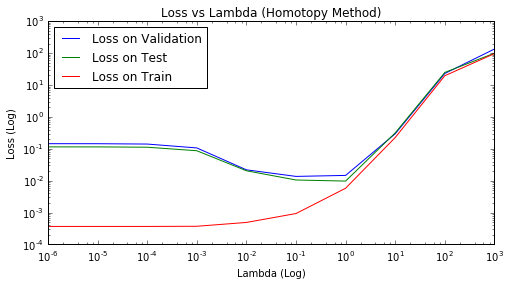

In [171]:
fig = plt.figure(figsize = (8,4))
plt.plot(lambda_list_1,validation_loss_1,label = "Loss on Validation")
plt.plot(lambda_list_1,test_loss_1,label = "Loss on Test")
plt.plot(lambda_list_1,train_loss_1,label = "Loss on Train")
plt.legend(loc = "upper left")
plt.yscale('log')
plt.xscale('log')
plt.title('Loss vs Lambda (Homotopy Method)')
plt.xlabel("Lambda (Log)")
plt.ylabel("Loss (Log)")
plt.show()

### 3.1.4

In [78]:
def shooting_algorithm_vector(X, y, w, Lambda, threshold = 1e-5):
    w = w.copy()
    (N,D) = X.shape
    XX2 = np.dot(X.T,X)*2
    Xy2 = np.dot(X.T,y)*2
    while True:
        ww = w.copy()
        for j in range(D):
            
            c = Xy2[j] - np.dot(XX2[j,:],w) + XX2[j,j]*w[j]
            a = XX2[j,j]

            if (np.abs(c/a)-Lambda/a)>0:
                w[j] = np.sign(c/a)*(np.abs(c/a)-Lambda/a)
            else:
                w[j] = 0
    

        if np.linalg.norm(w - ww) < threshold:
            return w

In [90]:
range_list = list(range(-6,4))
lambda_list_2 = list()
for i in range_list:
    lambda_list_2.append(10**i)

validation_loss_2 = np.zeros(len(range(10)))
train_loss_2 = np.zeros(len(range(10)))
w_list_2 = np.zeros(((len(range(10)),X_training_1.shape[1])))
test_loss_2 = np.zeros(len(range(10)))

startTime = datetime.now()                       

for i in range(len(range(-6,4))):                                                     
    if i == 0:
        w_list_2[0] = shooting_algorithm_vector(X_training_1, y_training_1,np.zeros(X_training_1.shape[1]), lambda_list_2[i], threshold = 1e-5)
    else:
        w_list_2[i] = shooting_algorithm(X_training_1, y_training_1,w_list_2[i-1], lambda_list_2[i], threshold = 1e-5)
    validation_loss_2[i] = compute_loss (X_validation_1,y_validation_1,w_list_2[i])
    train_loss_2[i] = compute_loss(X_training_1,y_training_1,w_list_2[i])
    test_loss_2[i] = compute_loss(X_testing_1,y_testing_1,w_list_2[i])
    
    print ("Lambda: ",lambda_list_2[i], "Loss on Train: ",train_loss_2[i], "Loss on Validation: ",validation_loss_2[i])
    
print (datetime.now() - startTime)    

Lambda:  1e-06 Loss on Train:  0.000367958300261 Loss on Validation:  0.144887928041
Lambda:  1e-05 Loss on Train:  0.00036795506378 Loss on Validation:  0.144613800367
Lambda:  0.0001 Loss on Train:  0.000367963352211 Loss on Validation:  0.141038147253
Lambda:  0.001 Loss on Train:  0.000372319277617 Loss on Validation:  0.106645207153
Lambda:  0.01 Loss on Train:  0.000490846418345 Loss on Validation:  0.0219292203877
Lambda:  0.1 Loss on Train:  0.000934173809958 Loss on Validation:  0.0136425854693
Lambda:  1 Loss on Train:  0.00580603441206 Loss on Validation:  0.0146642291507
Lambda:  10 Loss on Train:  0.225775391613 Loss on Validation:  0.296432133309
Lambda:  100 Loss on Train:  19.6094132941 Loss on Validation:  23.0648333575
Lambda:  1000 Loss on Train:  96.6647576982 Loss on Validation:  134.607314857
0:03:39.799623


In [97]:
print ("Best Lambda: "+ str(lambda_list_2[np.argmin(validation_loss_2)]))
print ("Minimum Loss on Validation: "+ str(min(validation_loss_2)))

Best Lambda: 0.1
Minimum Loss on Validation: 0.0136425854693


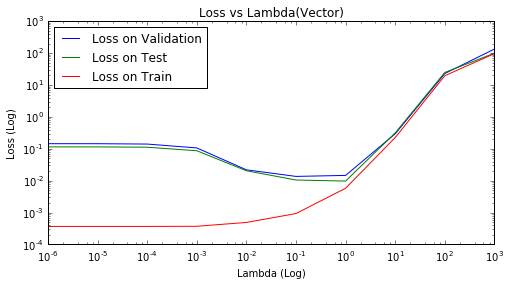

In [98]:
fig = plt.figure(figsize = (8,4))
plt.plot(lambda_list_2,validation_loss_2,label = "Loss on Validation")
plt.plot(lambda_list_2,test_loss_2,label = "Loss on Test")
plt.plot(lambda_list_2,train_loss_2,label = "Loss on Train")
plt.legend(loc = "upper left")
plt.yscale('log')
plt.xscale('log')
plt.title('Loss vs Lambda(Vector)')
plt.xlabel("Lambda (Log)")
plt.ylabel("Loss (Log)")
plt.show()

## 3.2 Deriving the Coordinate Minimizer for lasso

### 3.2.1

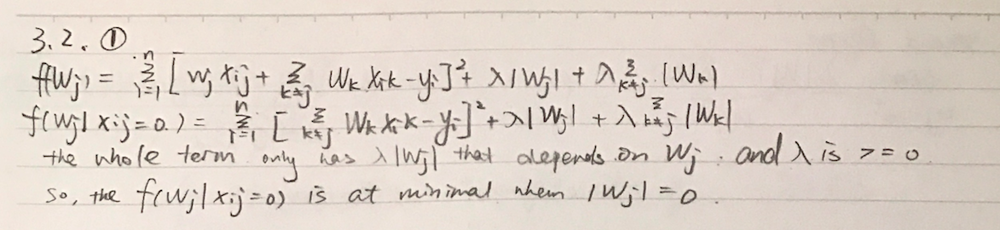

In [79]:
from IPython.display import Image 
Image(filename='/Users/sunevan/Desktop/3.2.1.png')

### 3.2.2

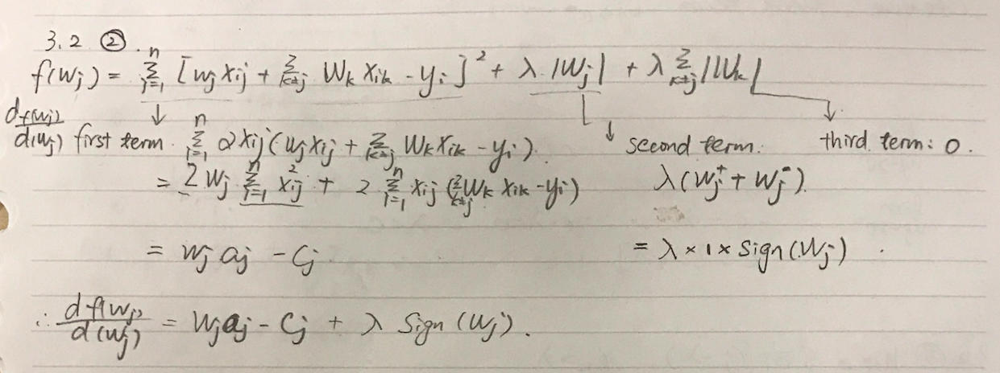

In [80]:
from IPython.display import Image 
Image(filename='/Users/sunevan/Desktop/3.2.2.png')

### 3.2.3

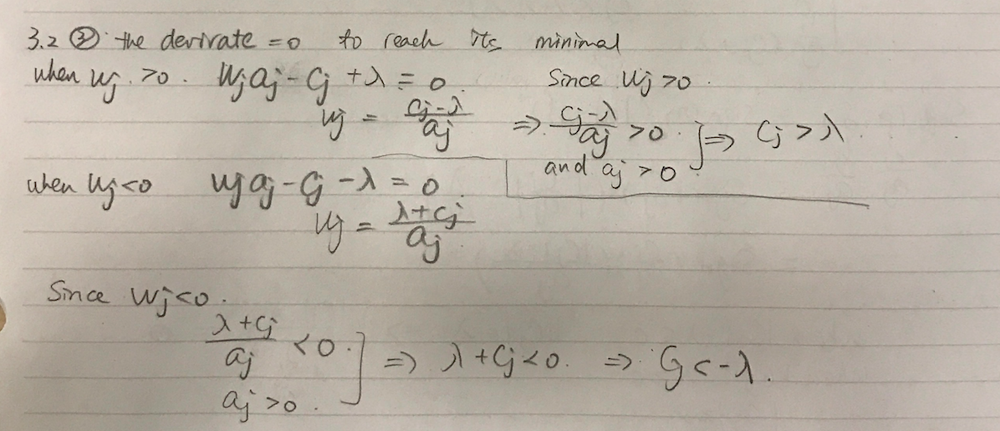

In [81]:
from IPython.display import Image 
Image(filename='/Users/sunevan/Desktop/3.2.3.png')

### 3.2.4

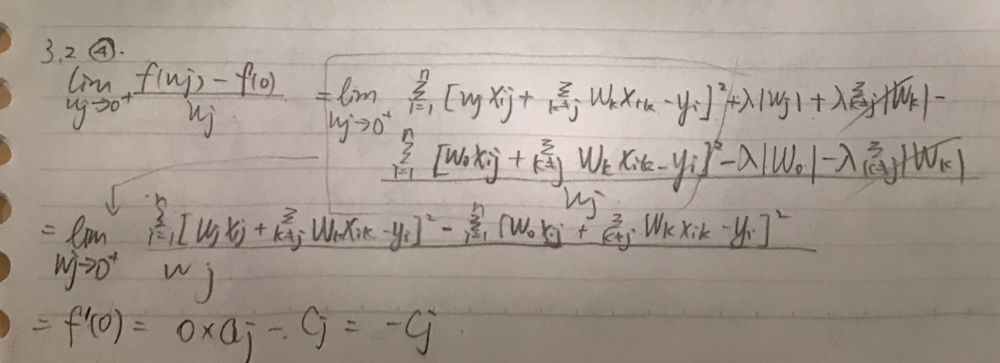

In [101]:
from IPython.display import Image 
Image(filename='/Users/sunevan/Desktop/3.2.4b.png')


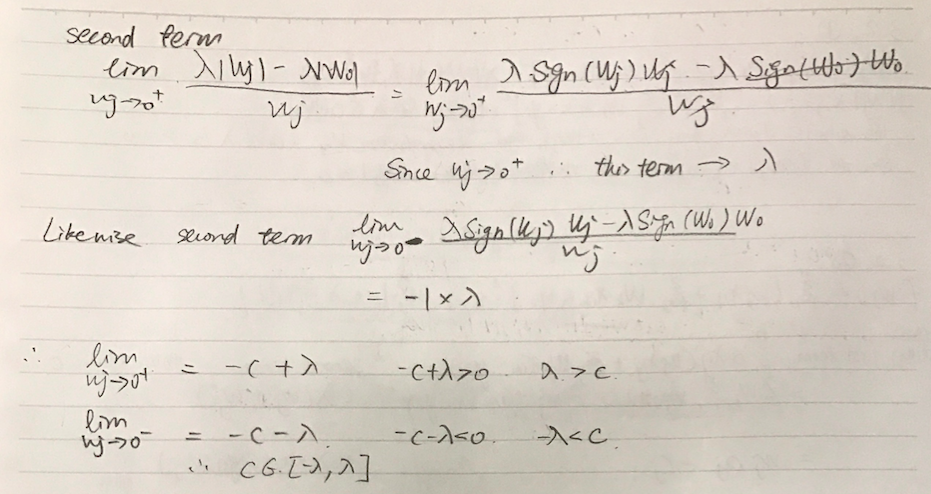

In [102]:
Image(filename='/Users/sunevan/Desktop/3.2.4a.png')

### 3.2.5

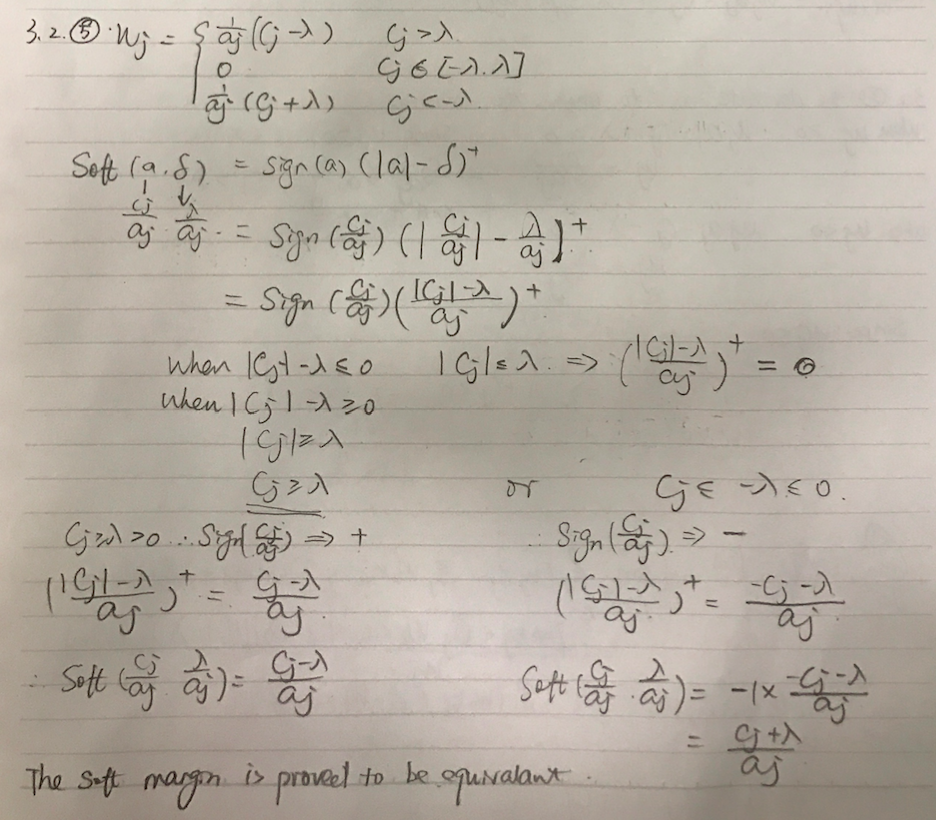

In [83]:
from IPython.display import Image 
Image(filename='/Users/sunevan/Desktop/3.2.5.png')

## 4. Lasso Properties

### 4.1.1

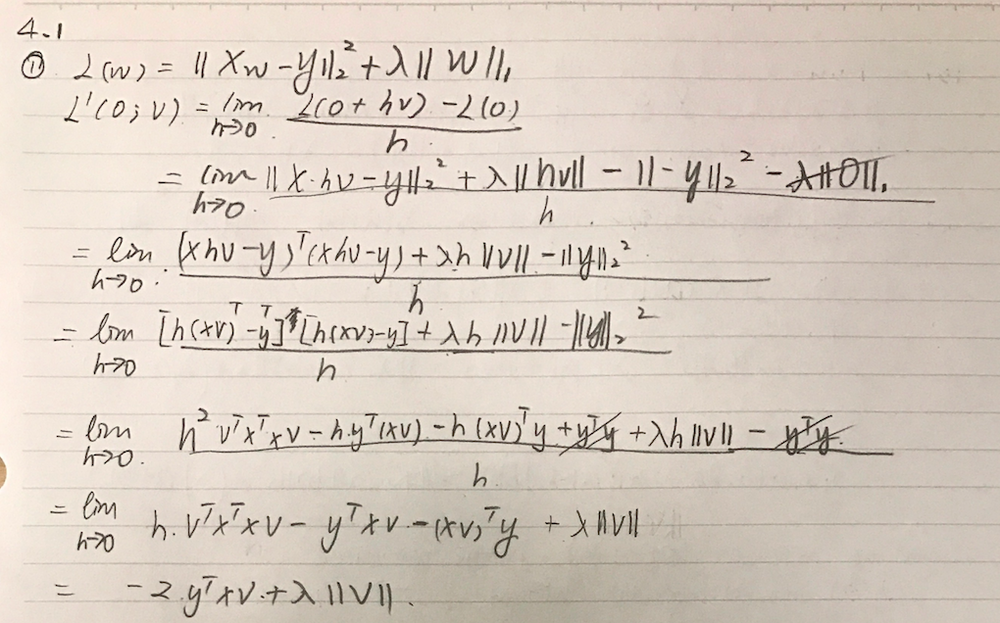

In [84]:
from IPython.display import Image 
Image(filename='/Users/sunevan/Desktop/4.1.1.png')

### 4.1.2

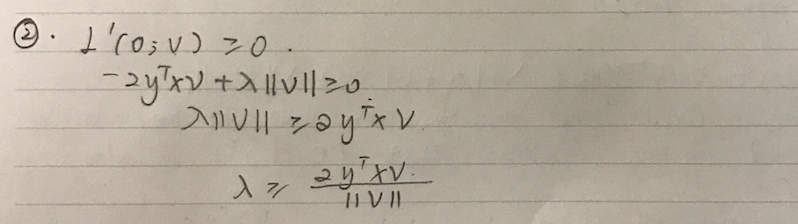

In [85]:
from IPython.display import Image 
Image(filename='/Users/sunevan/Desktop/4.1.2.png')

### 4.1.3

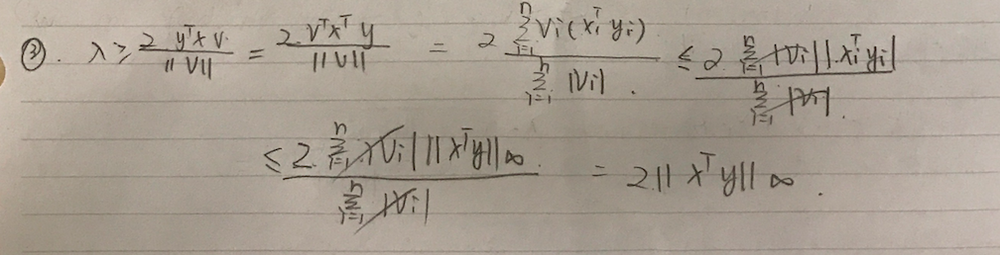

In [86]:
from IPython.display import Image 
Image(filename='/Users/sunevan/Desktop/4.1.3.png')

### 4.1.4 Optional 

### 4.2.1

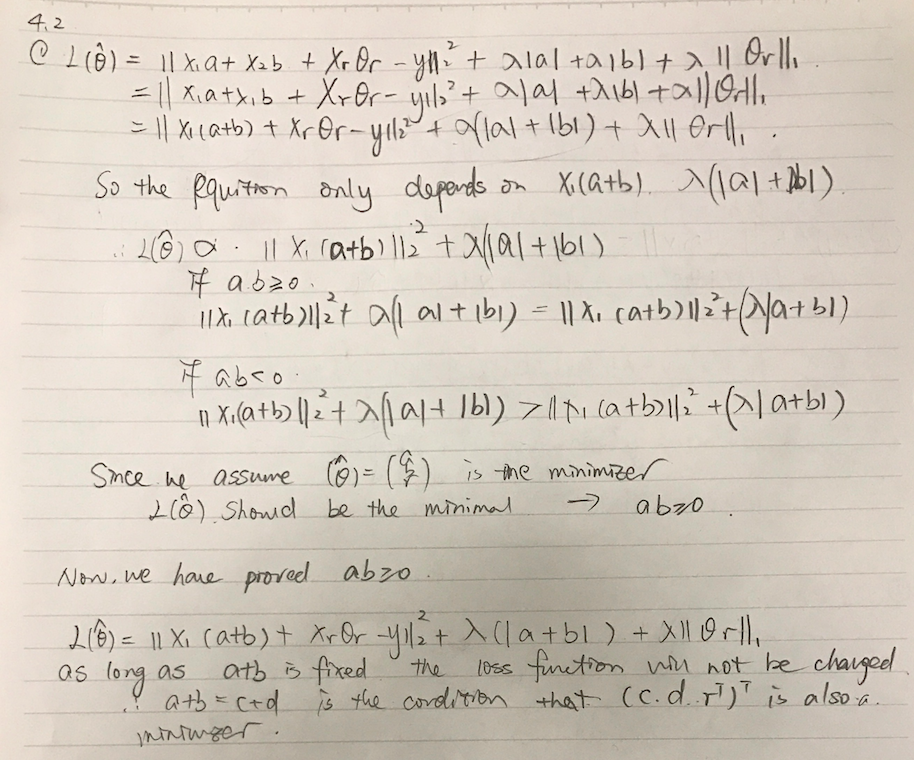

In [87]:
from IPython.display import Image 
Image(filename='/Users/sunevan/Desktop/4.2.1.png')

### 4.2.2

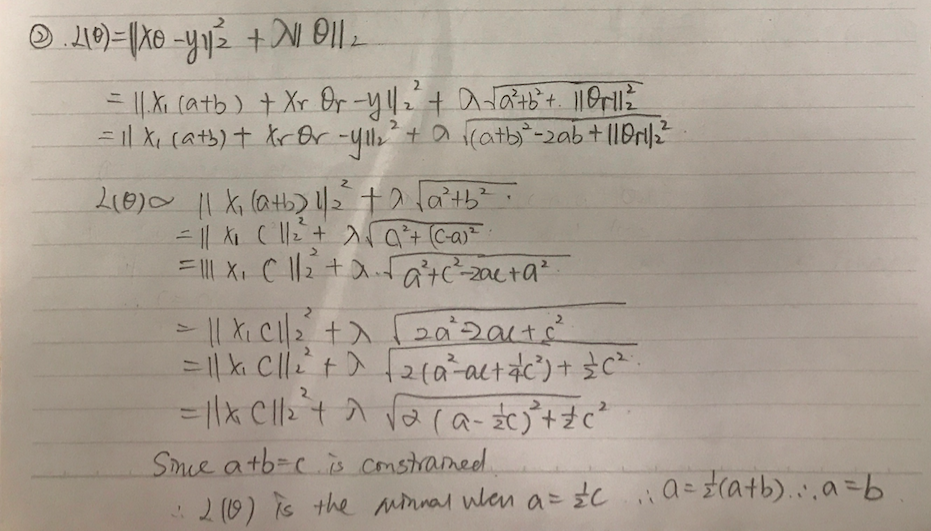

In [88]:
from IPython.display import Image 
Image(filename='/Users/sunevan/Desktop/4.2.2.png')

### 4.2.3 Optional 

## 5 & 6 Optional - Blank